In [ ]:
# 1. 미세분류(전이학습의 모델은 관여하지 않으나 어떤 모델을 이용하여 학습했는지는 강사님께 말씀드려야함)
# 2. 동결성,성능확인할 것(성능지표도 확인 및 제출해야됨)
# 3. 모델 제출
# 4. 성능평가 top1, 5, 10 지표가 담길 것(어떻게 책정했는지에 대한 방법도 제출해야됨)
# 5. 데이터셋은 강사님이 지정해놓은 데이터셋을 이용할 것이며
# 일반화 성능이 높은 것이 좋음
# 9.17일 00시까지(즉 16일 안에 끝내야함)

In [ ]:
# 📢9월 커리어업 모의 면접안내
# 안녕하세요. 인공지능사관학교입니다.
# 앞선 커리어업 자소서, 이력서 피드백, 포트폴리오 피드백에 이어
# 모의면접을 진행하려고 합니다.
# 일정 및 운영방식은 다음과 같습니다.
# 모의면접을 희망하시는분들은 마감날짜까지 "디스코드 DM"으로 "운영진"에게 신청해주세요!

# 일정: 9월 12일 16시 ~ 18시 / 9월 19일 16시 ~ 18시
# 플랫폼: 디스코드(카메라 켜고 진행)
# 면접관: 2명(별도 추가될 수 있음)
# 운영방법
# 학습자 1, 면접관 2로 운영되나, 신청자가 많을 경우 다 대 다 방식으로 운영 변경
# 사전 제출한 이력서, 포폴을 토대로 10분 질의, 5분 피드백 진행
# 신청자 취합 마감: 9월 8일 16시까지

In [2]:
import torch
import torch.nn.functional as F
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import json
import matplotlib.pyplot as plt
import torchvision.models as models
from torchvision.models import ResNet101_Weights

# 사전학습된 가중치 불러오기
weights = ResNet101_Weights.DEFAULT
model = models.resnet101(weights=weights)
print(model)
CLASSES = json.load(open('./data/imagenet_classes.json'))
idx2class = [CLASSES[str(i)] for i in range(1000)]

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

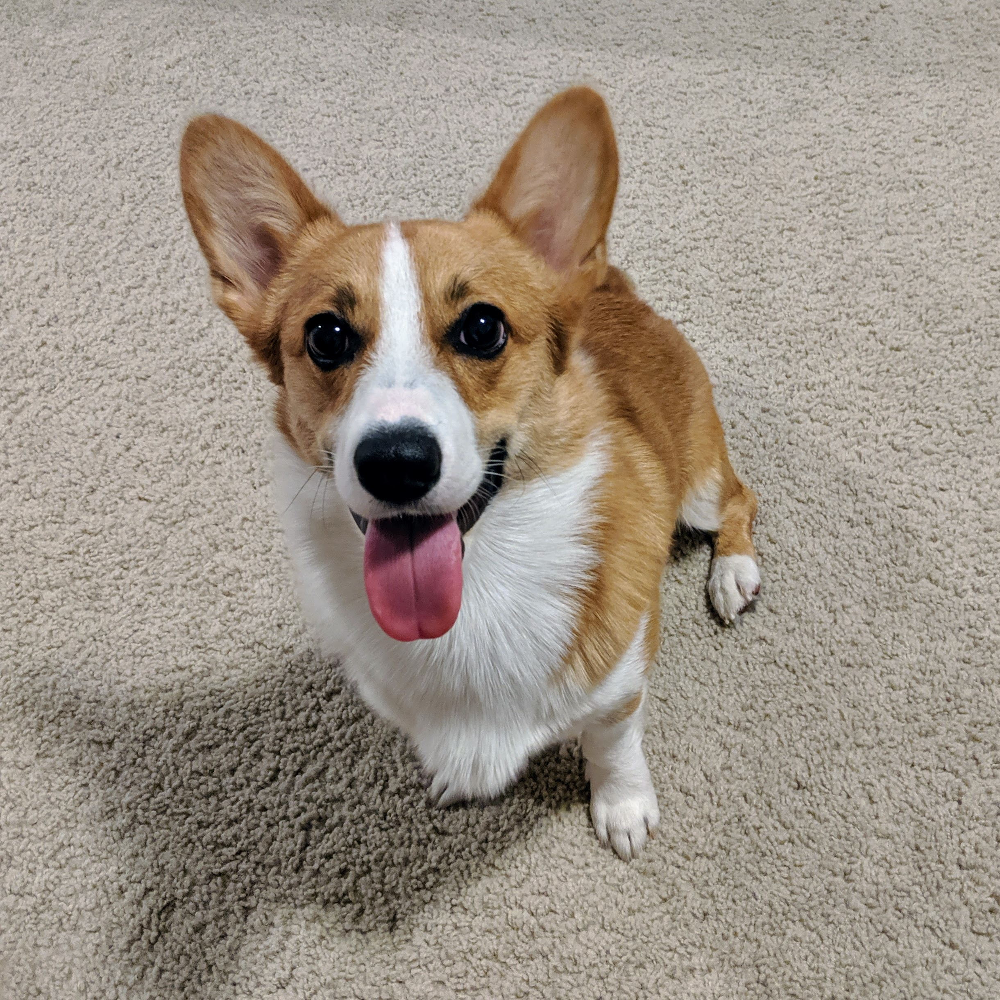

In [55]:
# img = Image.open('./data/chihuahua.jpg') # corgie.jpg, chihuahua.jpg
img = Image.open('./data/corgie.jpg') # corgie.jpg, chihuahua.jpg
img

In [56]:
tr = transforms.Compose([
    transforms.Resize((224,224), Image.BICUBIC),
    transforms.ToTensor(),
])
img_tr = tr(img)
img_tr = img_tr.unsqueeze(0)
img_tr.size()

torch.Size([1, 3, 224, 224])

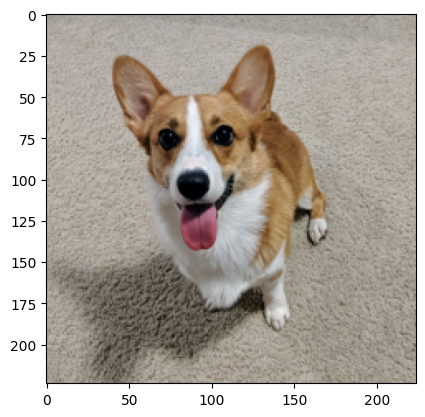

In [ ]:
v_img = img_tr.squeeze(0).detach()
v_img = v_img.transpose(0,2).transpose(0,1).numpy()
plt.imshow(v_img)

In [58]:
py = model(img_tr).max(1, keepdim=False)[1]
idx = py.item()

In [59]:
img_tr.shape

torch.Size([1, 3, 224, 224])

In [60]:
idx2class[idx]

'Pembroke, Pembroke Welsh corgi'

In [61]:
def f(img, es, gr): # 이미지 변경
    sign_gr = gr.sign()
    per_img = img+es*sign_gr
    per_img = torch.clamp(per_img, 0, 1)
    return per_img

In [62]:
img_tr.requires_grad_(True) # 구조 제어

tensor([[[[0.6314, 0.6353, 0.6353,  ..., 0.6902, 0.6627, 0.6431],
          [0.6275, 0.6627, 0.6353,  ..., 0.6627, 0.6627, 0.6118],
          [0.6510, 0.6275, 0.6353,  ..., 0.6235, 0.6980, 0.6784],
          ...,
          [0.6549, 0.6314, 0.6118,  ..., 0.6275, 0.6627, 0.6902],
          [0.6588, 0.6863, 0.6902,  ..., 0.6431, 0.6588, 0.6392],
          [0.6392, 0.6627, 0.6824,  ..., 0.6275, 0.6392, 0.7059]],

         [[0.6157, 0.6196, 0.6196,  ..., 0.6627, 0.6353, 0.6235],
          [0.6118, 0.6431, 0.6196,  ..., 0.6353, 0.6353, 0.5843],
          [0.6353, 0.6118, 0.6196,  ..., 0.5961, 0.6706, 0.6510],
          ...,
          [0.6157, 0.5922, 0.5765,  ..., 0.6000, 0.6353, 0.6588],
          [0.6196, 0.6510, 0.6549,  ..., 0.6118, 0.6235, 0.6078],
          [0.6000, 0.6314, 0.6431,  ..., 0.6039, 0.6157, 0.6824]],

         [[0.5804, 0.5843, 0.5843,  ..., 0.6275, 0.6000, 0.5882],
          [0.5765, 0.6118, 0.5843,  ..., 0.5922, 0.5961, 0.5490],
          [0.6000, 0.5804, 0.5804,  ..., 0

In [63]:
idx

263

In [64]:
out = model(img_tr)
loss = F.nll_loss(out, torch.tensor([151]))

model.zero_grad()
loss.backward()

gr = img_tr.grad.data
es = 0.03
pe_data = f(img_tr, es, gr)
out = model(pe_data)

In [65]:
out

tensor([[-3.0707e-01,  5.5873e-02, -8.5657e-02, -2.2329e-01, -1.6899e-01,
         -1.1579e-02,  1.3774e-03, -7.1588e-02, -5.6008e-04, -1.6882e-01,
          1.3057e-01,  4.2463e-02, -1.3508e-02, -2.6692e-02, -5.3522e-02,
         -1.0643e-01, -3.3653e-02,  3.6245e-02, -5.0836e-02, -3.7507e-02,
         -9.3818e-02, -1.9671e-01,  3.4556e-02,  1.4266e-01,  2.1962e-02,
         -4.9052e-02, -2.0807e-01, -1.0992e-02, -1.9805e-01, -2.1182e-01,
         -6.5807e-02, -3.3951e-01, -1.6768e-01, -8.1076e-02,  1.7236e-02,
         -1.5107e-01, -3.9071e-02,  9.9205e-02, -1.7177e-01, -5.1526e-02,
         -1.9490e-02, -1.6957e-01, -2.3810e-01, -3.0062e-01, -1.0813e-01,
         -1.8964e-01, -2.6082e-01, -3.2458e-01, -4.1450e-01, -2.9365e-01,
         -1.0224e-01,  1.9093e-01, -1.6739e-01, -9.7278e-03, -2.4596e-01,
         -1.2852e-01, -1.3869e-01,  8.9759e-02,  2.6486e-01,  2.1320e-02,
          2.9252e-01, -2.3316e-01, -1.0507e-01, -3.8871e-01, -3.2158e-01,
          3.6185e-02, -3.0940e-01, -7.

In [ ]:
py = out.max(1, keepdim=False)[1]
idx = py.item()
idx2class[idx] # Pembroke, Pembroke Welsh corgi 이게 원래 클래스임
# idx

'Cardigan, Cardigan Welsh corgi'

In [79]:
pe_data.shape

torch.Size([1, 3, 224, 224])

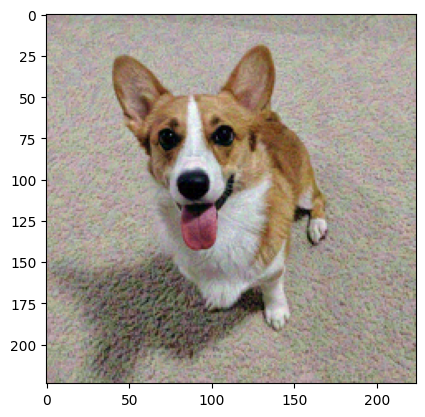

In [83]:
plt.imshow(pe_data.squeeze(0).detach().transpose(0,2).transpose(0,1).numpy())

In [87]:
import os, gdown, tarfile
import urllib.request

In [88]:
save_path = './data'
url = "https://drive.google.com/file/d/1HQ-IfGc2zsT6eqvuAE6ZnZyiHXJ09UjA/view"
target_path = os.path.join(save_path, "VOCtrainval_11-May-2012.tar")
# os.makedirs(save_path, exist_ok=True)
if not os.path.exists(target_path):
    gdown.download(url, target_path,quiet=False, fuzzy=True) # 구글드라이브 경로에서 다운
    # urllib.request.urlretrieve(url, target_path)
    with tarfile.open(target_path) as tar:
        tar.extractall(save_path)

Downloading...
From (original): https://drive.google.com/uc?id=1HQ-IfGc2zsT6eqvuAE6ZnZyiHXJ09UjA
From (redirected): https://drive.google.com/uc?id=1HQ-IfGc2zsT6eqvuAE6ZnZyiHXJ09UjA&confirm=t&uuid=85a8dbc9-6372-41a8-b22e-dd5b65874e45
To: c:\Users\devchoi\Desktop\TIL\2025\Python\data\VOCtrainval_11-May-2012.tar
100%|██████████| 2.00G/2.00G [03:18<00:00, 10.1MB/s]
C:\Users\devchoi\AppData\Local\Temp\ipykernel_19800\771040928.py:8: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(save_path)
